# Causal Injection into a Neural Network

In [1]:
import numpy as np
np.set_printoptions(suppress=True)
import math
import networkx as nx
import random
import pandas as pd
#import tensorflow as tf
#Disable TensorFlow 2 behaviour
from sklearn.model_selection import KFold  
from sklearn.preprocessing import StandardScaler  
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior() 
import os
from sklearn.metrics import mean_squared_error
from CASTLE2 import CASTLE
from utils import gen_random_dag, gen_data_nonlinear, heat_mat, plot_DAG, DAG_retreive_np, save_pickle, load_pickle, random_stability
from signal import signal, SIGINT
from sys import exit
import argparse
import plotly.express as px


Instructions for updating:
non-resource variables are not supported in the long term


## Set parameters

In [12]:
## Parameters Definition
random_dag = True
csv = 'synth_nonlinear.csv'
num_nodes = 20
branchf = 4
dataset_sz = 5000
output_log = 'castle.log'
n_folds = 1
reg_lambda = 1
reg_beta = 5
gpu = ''
ckpt_file = 'tmp.ckpt'
extension = ''
seed = 0


force_refit = False ## Refits the model if already present, False will only load it from ckpt_file
tuned = False ## Loads a tuned model saved in ckpt_file + "tuned"

tune = False ## Injects a loaded_adj into a model loaded from ckpt_file 
loaded_adj = None ## Adjacency matrix to be injected


## Generate or Load data

In [13]:
if random_dag:
    def swap_cols(df, a, b):
        df = df.rename(columns = {a : 'temp'})
        df = df.rename(columns = {b : a})
        return df.rename(columns = {'temp' : b})
    def swap_nodes(G, a, b):
        newG = nx.relabel_nodes(G, {a : 'temp'})
        newG = nx.relabel_nodes(newG, {b : a})
        return nx.relabel_nodes(newG, {'temp' : b})
    
    #Random DAG
    num_edges = int(num_nodes*branchf)
    G = gen_random_dag(num_nodes, num_edges, seed)

    noise = random.uniform(0.3, 1.0)
    print("Setting noise to ", noise)
    
    df = gen_data_nonlinear(G, SIZE = dataset_sz, var = noise).iloc[:dataset_sz]
    df_test =  gen_data_nonlinear(G, SIZE = int(dataset_sz*0.25), var = noise)
    
    for i in range(len(G.edges())):
        if len(list(G.predecessors(i))) > 0:
            df = swap_cols(df, str(0), str(i))
            df_test = swap_cols(df_test, str(0), str(i))
            G = swap_nodes(G, 0, i)
            break     
            
    df = pd.DataFrame(df)
    df_test = pd.DataFrame(df_test)  
    
    #print("Number of parents of G", len(list(G.predecessors(i))))
    print("Edges = ", len(G.edges()), list(G.edges()))
    
else:
    '''
    Toy DAG
    The node '0' is the target in the Toy DAG
    '''
    G = nx.DiGraph()
    for i in range(10):
        G.add_node(i)
    G.add_edge(1,2)
    G.add_edge(1,3)
    G.add_edge(1,4)
    G.add_edge(2,5)
    G.add_edge(2,0)
    G.add_edge(3,0)
    G.add_edge(3,6)
    G.add_edge(3,7)
    G.add_edge(6,9)
    G.add_edge(0,8)
    G.add_edge(0,9)

    if csv:
        df = pd.read_csv(csv)
        df_test = df.iloc[-1000:]
        df = df.iloc[:dataset_sz]
    else: 
        df = gen_data_nonlinear(G, SIZE = dataset_sz)
        df_test = gen_data_nonlinear(G, SIZE = 1000)
        
scaler = StandardScaler()
if random_dag:
    df = scaler.fit_transform(df)
else:
    if csv:
        scaler.fit(pd.read_csv(csv))
        df = scaler.transform(df)
    else:
        df = scaler.fit_transform(df)

df_test = scaler.transform(df_test)

X_test = df_test
y_test = df_test[:,0]
X_DAG = df

plot_DAG(mat=G, graphic_type='py', debug=False, ori_dag=None, names=None)

Setting noise to  0.9115576767302396
Edges =  63 [(0, 19), (0, 6), (1, 8), (1, 19), (1, 3), (1, 18), (1, 13), (2, 10), (2, 12), (2, 6), (2, 19), (2, 4), (2, 17), (2, 0), (2, 11), (2, 7), (2, 9), (2, 8), (3, 19), (3, 11), (3, 6), (6, 5), (7, 10), (7, 4), (7, 6), (8, 17), (8, 15), (8, 16), (8, 4), (9, 4), (9, 3), (9, 5), (10, 17), (10, 19), (11, 5), (12, 13), (12, 9), (12, 10), (12, 16), (12, 18), (13, 10), (13, 19), (14, 16), (14, 15), (14, 5), (14, 2), (15, 11), (15, 17), (15, 10), (16, 15), (16, 4), (16, 9), (17, 0), (17, 9), (17, 19), (18, 6), (18, 7), (18, 13), (18, 8), (18, 10), (18, 5), (19, 4), (19, 6)]
Total Number of Edges in G: 63
Max in degree: 7
DAG: True


In [28]:
known_perc = 0.2
n = int(len(G.edges())*known_perc)
random_stability(0)
known_edges = random.sample(list(G.edges()), n)
print(len(known_edges), known_edges)

adj_mat_full = 1 - np.identity(num_nodes)

# print([adj_mat_full[k[0],k[1]] for k in known_edges])
# print([adj_mat_full[k[1],k[0]] for k in known_edges])
for item in known_edges:
#     print(item[1],item[0])
    adj_mat_full[item[1],item[0]]=0
# print([adj_mat_full[k[1],k[0]] for k in known_edges])
adj_mat_full


12 [(17, 19), (7, 6), (15, 10), (18, 7), (8, 15), (1, 8), (2, 9), (10, 17), (9, 5), (8, 17), (16, 4), (3, 11)]


array([[0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1.],
       [1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1.],
       [1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1., 1., 0., 1., 1., 1., 1.],
       [1., 1., 1., 0

## Castle Fitting - with or without injection

In [6]:
if n_folds > 1:
    kf = KFold(n_splits = n_folds, random_state = 1, shuffle = True)

    fold = 0
    REG_castle = []
    print("Dataset limits are", np.ptp(X_DAG), np.ptp(X_test), np.ptp(y_test))
    for train_idx, val_idx in kf.split(X_DAG):
        fold += 1
        print("fold = ", fold)
        print("******* Doing dataset size = ", len(train_idx) , "****************")
        X_train = X_DAG[train_idx]
        y_train = np.expand_dims(X_DAG[train_idx][:,0], -1)
        X_val = X_DAG[val_idx]
        y_val = X_DAG[val_idx][:,0]

        w_threshold = 0.3
        castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                            w_threshold = w_threshold, ckpt_file = ckpt_file
                        )

        num_nodes = np.shape(X_DAG)[1]
        castle.fit(X=X_train, y=y_train, num_nodes=num_nodes, X_val=X_val, y_val=y_val,
                overwrite=True, tune=False, maxed_adj=None, tuned=False)

        W_est = castle.pred_W(X_DAG, np.expand_dims(X_DAG[:,0], -1))
        heat_mat(W_est)
        REG_castle.append(mean_squared_error(castle.pred(X_test), y_test))
        print("MSE = ", mean_squared_error(castle.pred(X_test), y_test))

        if fold > 1:
            print("MEAN =", np.mean(REG_castle), "STD =", np.std(REG_castle))
else:
        print("******* Doing dataset size = ", dataset_sz , "****************")
        X_train = X_DAG
        y_train = np.expand_dims(X_DAG[:,0], -1)
        X_val = X_test
        y_val = y_test

        w_threshold = 0.3
        castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                            w_threshold = w_threshold, ckpt_file = ckpt_file, seed = seed
                        )

        num_nodes = np.shape(X_DAG)[1]
        castle.fit(X=X_train, y=y_train, num_nodes=num_nodes, X_val=X_val, y_val=y_val,
                overwrite=force_refit, tune=tune, tuned=tuned, maxed_adj=loaded_adj, seed = seed )
        print("MSE = ", mean_squared_error(castle.pred(X_test), y_test))

        W_est = castle.pred_W(X_DAG, np.expand_dims(X_DAG[:,0], -1))
        heat_mat(W_est)

******* Doing dataset size =  5000 ****************
Random seed 2021 set for:
Random seed 2021 set for:
Step 1, Loss= 38.3658 h_value: 0.00062561035
Val Loss= 0.9424
Step 2, Loss= 0.9934 h_value: 0.006570816
Val Loss= 0.7561
Step 3, Loss= 0.7764 h_value: 0.003835678
Val Loss= 0.6984
Step 4, Loss= 0.7421 h_value: 0.0022974014
Val Loss= 0.6960
Step 5, Loss= 0.7515 h_value: 0.0013971329
Val Loss= 0.7048
Step 6, Loss= 0.7511 h_value: 0.0009651184
Val Loss= 0.7112
Step 7, Loss= 0.7373 h_value: 0.0006380081
Val Loss= 0.7078
Step 8, Loss= 0.7542 h_value: 0.00046253204
Val Loss= 0.6863
Step 9, Loss= 0.7495 h_value: 0.00039672852
Val Loss= 0.6885
Step 10, Loss= 0.7624 h_value: 0.00033473969
Val Loss= 0.7036
Step 11, Loss= 0.7502 h_value: 0.00034427643
Val Loss= 0.6838
Step 12, Loss= 0.7387 h_value: 0.00025177002
Val Loss= 0.6826
Step 13, Loss= 0.7187 h_value: 0.0002746582
Val Loss= 0.7018
Step 14, Loss= 0.7302 h_value: 0.00023460388
Val Loss= 0.7057
Step 15, Loss= 0.7527 h_value: 0.0002632141
V

,0,1,2,3,4,5,6,7,8,9
0,0.0,0.005,0.022,0.016,0.003,0.029,0.028,0.017,0.052,0.063
1,0.01,0.0,0.066,0.068,0.074,0.008,0.009,0.009,0.009,0.005
2,0.104,0.047,0.0,0.027,0.02,0.13,0.008,0.008,0.035,0.007
3,0.095,0.045,0.024,0.0,0.026,0.018,0.1,0.117,0.036,0.007
4,0.009,0.047,0.018,0.024,0.0,0.01,0.013,0.008,0.037,0.004
5,0.029,0.002,0.015,0.008,0.009,0.0,0.014,0.016,0.011,0.008
6,0.019,0.001,0.008,0.015,0.003,0.009,0.0,0.02,0.009,0.151
7,0.031,0.005,0.001,0.015,0.004,0.023,0.028,0.0,0.006,0.011
8,0.034,0.005,0.004,0.004,0.003,0.012,0.017,0.005,0.0,0.013
9,0.029,0.002,0.005,0.006,0.005,0.008,0.099,0.011,0.006,0.0


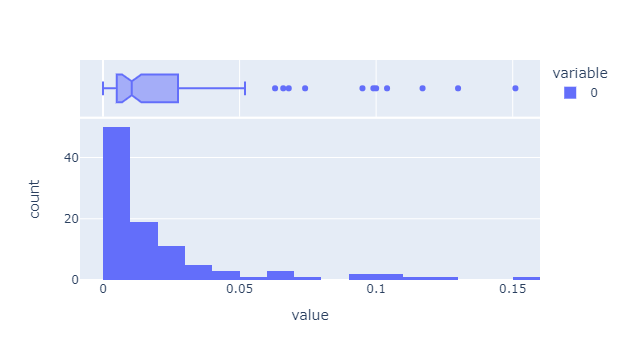

In [7]:
fig = px.histogram(W_est.flatten(), marginal="box")
fig.show()

tau: 0.05


,0,1,2,3,4,5,6,7,8,9
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052,0.063
1,0.0,0.0,0.066,0.068,0.074,0.0,0.0,0.0,0.0,0.0
2,0.104,0.0,0.0,0.0,0.0,0.13,0.0,0.0,0.0,0.0
3,0.095,0.0,0.0,0.0,0.0,0.0,0.1,0.117,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.151
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Total Number of Edges in G: 11
Max in degree: 2
DAG: True

Black Arrow = Edge in the original DAG,
Red Arrow = Missing Edge, Blue Arrow = Additional Edge 


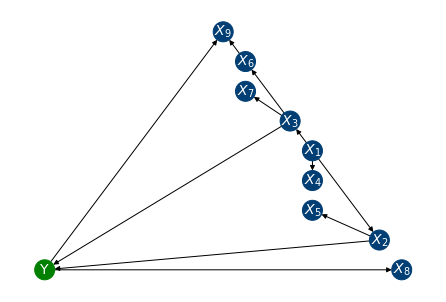

In [8]:
tau = 0.05
print("tau:",tau)

maxed_adj = DAG_retreive_np(W_est, tau)

heat_mat(maxed_adj)

plot_DAG(maxed_adj, ori_dag=G, graphic_type = "nx")


## Reconstruction experiment

In [14]:
dset = '([\w.]+)'

## Versions
# 'v3' reconstrunction toy experiment - 84%
# 'p1' = partial toy experiment - 96%


version = 'r2'
theta = 0.05

folder = './results/adjmats/'

import re

all_taus = []
for filename in os.listdir(folder):
#     print(filename)
    if version in ['v3','p1']:
        match = re.search(f'W_est.{dset}.([\w.]+).([\w.]+).{version}.pkl$', filename)
    else:
        match = re.search(f'W_est.{dset}.([\w.]+).([\w.]+).{str(theta)}.{version}.pkl$', filename)
    if match:
        dsets, out_f, in_f = match.groups()
        W_est = load_pickle(os.path.join(folder, filename), verbose=False)

        # W_est = load_pickle(f"results/adjmats/W_est.{dset}.{out_f}.{in_f}.{version}.pkl")
        # # fig = px.histogram(W_est.flatten(), marginal="box")
        # # fig.show()

        tau_list = list(np.arange(min(W_est.flatten()), max(W_est.flatten()), 0.005))
        scores = []

        for tau in tau_list:
            # tau = 0.1
        #     print("tau:",tau)

            maxed_adj = DAG_retreive_np(W_est, tau)

            G1 = nx.from_numpy_matrix(maxed_adj, create_using=nx.DiGraph, parallel_edges=False)

            a = set(G.edges())
            b = set(G1.edges())

            import math
            penalty_mis = -1
            penalty_add = -1

            n=G.number_of_nodes()
            r=2
            n_perm = math.factorial(n)/math.factorial(n-r)

        #     print("Equal sets:",a==b)
            # print("intersection:",a.intersection(b)   )
            # print("union:",a.union(b)        )
            # print("unequal:",a.union(b)  - a.intersection(b))   

        #     print("Missing edges", len(a-a.intersection(b)))
        #     print("Added edges", len(b-a.intersection(b)))

            DAG_score = (n_perm + len(a-a.intersection(b))*penalty_mis + len(b-a.intersection(b))*penalty_add)/n_perm
        #     print("DAG score", DAG_score)

            scores.append((tau,DAG_score, len(G1.edges()), len(a-a.intersection(b)), len(b-a.intersection(b)), 1-len(a.intersection(b))/len(G1.edges()), len(a.intersection(b))))
#         print(scores)
        c_tau = max([a[1] for a in scores])   
#         c_tau = 0.05
        max_tau =  [a[0] for a in scores if a[1] ==c_tau][0]
        score =    [a[1] for a in scores if a[1] ==c_tau][0]
        total =    [a[2] for a in scores if a[1] ==c_tau][0]
        missing =  [a[3] for a in scores if a[1] ==c_tau][0]
        added =    [a[4] for a in scores if a[1] ==c_tau][0]
        perfect =    round(len([a[1] for a in scores if a[1] ==c_tau and a[1] ==1])/len([a[1] for a in scores if a[1] ==c_tau]),2)
        wrong = [a[5] for a in scores if a[1] ==c_tau][0]
#         max_2 =    round(len([a[1] for a in scores if a[1] ==c_tau and ([a[3] for a in scores if a[1] ==c_tau][0]+[a[4] for a in scores if a[1] ==c_tau][0])<=2])/len([a[1] for a in scores if a[1] ==c_tau]),2)
        if dsets == '1250':
            print(dsets, out_f, in_f,[a[3] for a in scores if a[1] ==c_tau][0], [a[4] for a in scores if a[1] ==c_tau][0], [a[1] for a in scores if a[1] ==c_tau and ([a[3] for a in scores if a[1] ==c_tau][0]+[a[4] for a in scores if a[1] ==c_tau][0])<=4],[a[1] for a in scores if a[1] ==c_tau])
#             print(dsets, out_f, in_f,[a[1] for a in scores if a[1] ==c_tau and a[1] ==1],[a[1] for a in scores if a[1] ==c_tau])
        all_taus.append((dsets, out_f, in_f, max_tau, missing, added, perfect, wrong))

df = pd.DataFrame(all_taus)
df.columns = ['Size', 'out_f', 'in_f','Best $\tau$', 'Missing edges', 'Added edges', 'Perfect%', 'Wrong%']
df1=df[['Size', 'out_f', 'in_f', 'Missing edges', 'Added edges']]
df1.sort_values(by=list(df.columns[[0,1,2]]),axis=0)
df2=df[['Size', 'out_f', 'in_f','Best $\tau$', 'Wrong%']]

table = df1.groupby('Size', as_index=False).agg([ 'min','median','max']).round(2)
table1 = df1.groupby('Size', as_index=False).agg([ 'mean','std']).round(2).T
table2 = df.groupby('Size', as_index=False).agg([ 'mean','std']).round(2).T
table3 = df2.groupby('Size', as_index=False).agg([ 'mean','std']).round(2)
display(table)
display(table1)
display(table2)
display(table3)


def compute_top_2(names):
    t = ''
    pcount = round(len(names)/len(np.unique(names)))
    _, idx = np.unique(names, return_index=True)
    names = names[np.sort(idx)]
    print(names)
    for i in range(len(names)):
        if pcount>1:
            t += '& & \multicolumn{' + str(pcount) + '}{c}{' + str(names[i]) + '}'
        else:
            t += '& & '+str(names[i])
    return t
            
# top1 = '\multirow{2}{*}{Dataset} & \multirow{2}{*}{BC$^{*}$}' + compute_top(table.columns.values[1:]) + '\\\\'
top1 = '' + compute_top_2(table.columns.values) + '\\\\ \n\hline '

print_table = lambda table, top : table.to_latex(escape = False, index = True, index_names = False, header =False,
                     formatters=[(lambda x : '\!' + str(x*100) + '%\!') for col in table.columns.values],
#                      header = [f'\!\!{nice_relations[col[-1:]] if col != "BC" else ""}\!\!' for col in table.columns.values],\
                     column_format = 'r' + 'c' * (len(table.columns.values)),
                    ).replace(r'\toprule', top).replace(r'\midrule', r'\hline').replace(r'\bottomrule', r'\hline').replace('.0%', '%').replace('\!%', '\!0%').replace('%', '\%').replace('.0\!', '\!')

print(print_table(table3, top1))
# maxed_adj = DAG_retreive_np(W_est, 0.08)
# heat_mat(maxed_adj)
# plot_DAG(maxed_adj, ori_dag=G, graphic_type = "py")

Missing edges            Added edges           
                min median max         min median max
Size                                                 
100              63     63  63           1      1   4
1000             55     60  62           0      1   6
10000            30     37  41           0      2  12
20000            33     37  40           0      3   7
5000             32     37  41           0      4   8

Size                  100   1000  10000  20000   5000
Missing edges mean  63.00  59.48  36.84  36.92  35.96
              std    0.00   2.24   2.37   1.85   2.28
Added edges   mean   1.20   1.56   2.16   2.56   4.12
              std    0.65   1.96   2.51   1.71   2.17

Size                  100   1000  10000  20000   5000
Best $\tau$   mean   0.17   0.11   0.04   0.03   0.03
              std    0.01   0.02   0.01   0.01   0.01
Missing edges mean  63.00  59.48  36.84  36.92  35.96
              std    0.00   2.24   2.37   1.85   2.28
Added edges   mean   1.20   1.56   2.16   2.56   4.12
              std    0.65   1.96   2.51   1.71   2.17
Perfect%      mean   0.00   0.00   0.00   0.00   0.00
              std    0.00   0.00   0.00   0.00   0.00
Wrong%        mean   1.00   0.19   0.07   0.08   0.13
              std    0.00   0.19   0.06   0.05   0.06

Best $\tau$       Wrong%      
             mean   std   mean   std
Size                                
100          0.17  0.01   1.00  0.00
1000         0.11  0.02   0.19  0.19
10000        0.04  0.01   0.07  0.06
20000        0.03  0.01   0.08  0.05
5000         0.03  0.01   0.13  0.06

[('Missing edges', 'min') ('Missing edges', 'median') ('Missing edges', 'max') ('Added edges', 'min') ('Added edges', 'median') ('Added edges', 'max')]
\begin{tabular}{rcccc}
& & ('Missing edges', 'min')& & ('Missing edges', 'median')& & ('Missing edges', 'max')& & ('Added edges', 'min')& & ('Added edges', 'median')& & ('Added edges', 'max')\\ 
\hline 
100   & \!17\%\! & \!1\%\! &             \!100\%\! &  \!0\%\! \\
1000  & \!11\%\! & \!2\%\! &              \!19\%\! & \!19\%\! \\
10000 &  \!4\%\! & \!1\%\! & \!7.000000000000001\%\! &  \!6\%\! \\
20000 &  \!3\%\! & \!1\%\! &               \!8\%\! &  \!5\%\! \\
5000  &  \!3\%\! & \!1\%\! &              \!13\%\! &  \!6\%\! \\
\hline
\end{tabular}



## Tau cross validation

In [ ]:
run_tau_xval = False
if run_tau_xval:

    scaler = StandardScaler()
    if random_dag:
        df = scaler.fit_transform(df)
    else:
        if csv:
            scaler.fit(pd.read_csv(csv))
            df = scaler.transform(df)
        else:
            df = scaler.fit_transform(df)

    df_test = scaler.transform(df_test)

    X_test = df_test
    y_test = df_test[:,0]
    X_DAG = df

    n_folds=10

    if n_folds > 1:
        kf = KFold(n_splits = n_folds, random_state = 1, shuffle = True)

    #         taus = [-1, 0, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11
        #, 0.12, 0.13, 0.14, 0.15  0.2, 0.25, 0.3
    #         ]
        taus = [-1, 0.05]
        REG_castle = []
        score = {}
        for tau in taus:
            fold = 0
            print("Dataset limits are", np.ptp(X_DAG), np.ptp(X_test), np.ptp(y_test))
            for train_idx, val_idx in kf.split(X_DAG):
                fold += 1
                print("fold = ", fold)
                print("******* Doing dataset size = ", len(train_idx) , "****************")
                X_train = X_DAG[train_idx]
                y_train = np.expand_dims(X_DAG[train_idx][:,0], -1)
                X_val = X_DAG[val_idx]
                y_val = X_DAG[val_idx][:,0]

                ckpt_file = 'castlenet.ckpt'
                
                if tau >= 0:
                    castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                                        w_threshold = tau, ckpt_file = ckpt_file, tune = True, hypertrain = True, adj_mat=W_est, seed=seed)
                    castle.fit(X=X_train, y=y_train, num_nodes=np.shape(X_DAG)[1], X_val=X_val, y_val=y_val,
                            overwrite=False, tune=True, tuned=False, seed=seed)
                else:
                    castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                                        w_threshold = tau, ckpt_file = ckpt_file)
                    castle.fit(X=X_train, y=y_train, num_nodes=np.shape(X_DAG)[1], X_val=X_val, y_val=y_val,
                            overwrite=True, tune=False, maxed_adj=None, tuned=False)


                W_est = castle.pred_W(X_DAG, np.expand_dims(X_DAG[:,0], -1))
                heat_mat(W_est)

                G1 = nx.from_numpy_matrix(W_est, create_using=nx.DiGraph, parallel_edges=False)

                REG_castle.append(mean_squared_error(castle.pred(X_test), y_test))
                print("MSE = ", mean_squared_error(castle.pred(X_test), y_test))

                if fold > 1:
                    print("MEAN =", np.mean(REG_castle), "STD =", np.std(REG_castle))

                score["MSE"] = {mean_squared_error(castle.pred(X_test), y_test)}

                score["tau"] = tau
                score["fold"] = fold

                a = set(G.edges())
                b = set(G1.edges())

                print("Equal sets:",a==b)
                print("intersection:",a.intersection(b)   )
                print("union:",a.union(b)        )
                print("unequal:",a.union(b)  - a.intersection(b))   

                print("Missing:",len(a-a.intersection(b)))
                print("Added:",len(b-a.intersection(b)))

                score["Missing edges"] = len(a-a.intersection(b))
                score["Added edges"] = len(b-a.intersection(b))

                n=G.number_of_nodes()
                r=2
                n_perm = math.factorial(n)/math.factorial(n-r)
                penalty_mis = -1
                penalty_add = -1
                penalty_dir = -1
                score["DAG score"] = (n_perm + len(a-a.intersection(b))*penalty_mis + len(b-a.intersection(b))*penalty_add)/n_perm

                result_metrics_dict["tau="+str(tau)+", fold="+str(fold)] = score

                print("tau:",tau, "fold:",fold, "MSE:",score['MSE'])

                save_pickle(result_metrics_dict, os.path.join(args.FOLDER, f"5FoldCASTLE.Reg.Synth_1.pkl"))

    else:
            print("******* Doing dataset size = ", dataset_sz , "****************")
            X_train = X_DAG
            y_train = np.expand_dims(X_DAG[:,0], -1)
            X_val = X_test
            y_val = y_test

            w_threshold = 0.3
            castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                                w_threshold = w_threshold, ckpt_file = ckpt_file
                            )

            num_nodes = np.shape(X_DAG)[1]
            castle.fit(X=X_train, y=y_train, num_nodes=num_nodes, X_val=X_val, y_val=y_val,
                    overwrite=force_refit, tune=tune, tuned=tuned, maxed_adj=loaded_adj)

            W_est = castle.pred_W(X_DAG, np.expand_dims(X_DAG[:,0], -1))
            heat_mat(W_est)

Dataset limits are 12.65257536387395 13.635194764922032 9.458168642760073
fold =  1
******* Doing dataset size =  5000 ****************
Random seed 0 set for:
 - PYTHONHASHSEED (env)
 - random
 - NumPy
 - TensorFlow
 - PyTorch
   -> deterministic
Destructor Called... Cleaning up
Random seed 0 set for:
 - PYTHONHASHSEED (env)
 - random
 - NumPy
 - TensorFlow
 - PyTorch
   -> deterministic
Step 1, Loss= 61.7074 h_value: 0.00048446655
Val Loss= 0.6049
Step 2, Loss= 0.5831 h_value: 0.00077438354
Val Loss= 0.5394
Step 3, Loss= 0.5079 h_value: 0.0006713867
Val Loss= 0.5936
Step 4, Loss= 0.5426 h_value: 0.0005645752
Val Loss= 0.5005
Step 5, Loss= 0.4720 h_value: 0.0004940033
Val Loss= 0.5220
Step 6, Loss= 0.4842 h_value: 0.00039958954
Val Loss= 0.5009
Step 7, Loss= 0.4601 h_value: 0.0003299713
Val Loss= 0.5024
Step 8, Loss= 0.4768 h_value: 0.00028038025
Val Loss= 0.4981
Step 9, Loss= 0.4627 h_value: 0.00022506714
Val Loss= 0.4763
Step 10, Loss= 0.4376 h_value: 0.0002040863
Val Loss= 0.4797
St

In [7]:

filename = f"5FoldCASTLE.Reg.Synth.pkl"
describe = load_pickle(os.path.join(filename))

agg_stats = pd.DataFrame([(describe[c]['theta'],describe[c]['fold'],describe[c]['MSE'],describe[c]['DAG score']) for c in describe]).groupby(0, as_index=False).agg({1 : ['max'], 2 : ['mean', 'std'], 3 : ['mean', 'std']})
agg_stats.columns = ['theta', 'folds', 'MSE_mean', 'MSE_std', 'DAG_mean', 'DAG_std']

agg_stats.loc[agg_stats['theta']==-1,'theta'] = -0.05

# display(agg_stats)

n_edges = pd.DataFrame([(theta, nx.from_numpy_matrix(DAG_retreive_np(W_est, theta), create_using=nx.DiGraph, parallel_edges=False).number_of_edges()) for theta in agg_stats['theta']])

n_edges.loc[n_edges[0]==-1,0] = -0.05
n_edges.loc[n_edges[0]==-0.05,1] = nx.from_numpy_matrix(W_est, create_using=nx.DiGraph, parallel_edges=False).number_of_edges()

# display(n_edges)

n_edges_DAG = n_edges.merge(pd.DataFrame([(theta, nx.is_directed_acyclic_graph(nx.from_numpy_matrix(DAG_retreive_np(W_est, theta), create_using=nx.DiGraph, parallel_edges=False))) for theta in agg_stats['theta']]), on=0)

n_edges_DAG.columns = ['theta', 'N_edges', 'is_DAG']

agg_stats.merge(n_edges_DAG,on='theta')



Loaded PICKLE from 5FoldCASTLE.Reg.Synth.pkl


,theta,folds,MSE_mean,MSE_std,DAG_mean,DAG_std,N_edges,is_DAG
0,-0.05,10,0.532813,0.056252,0.122222,0.0,90,False
1,0.00,10,0.518179,0.038272,0.600000,0.0,49,False
2,0.01,10,0.479190,0.017130,0.811111,0.0,30,False
3,0.02,10,0.445529,0.029406,0.900000,0.0,15,True
4,0.03,10,0.419599,0.021601,0.944444,0.0,11,True
5,0.04,10,0.425598,0.029472,0.988889,0.0,11,True
6,0.05,10,0.544935,0.051915,1.000000,0.0,11,True
7,0.06,10,0.421303,0.027336,0.977778,0.0,9,True
8,0.07,10,0.420253,0.027662,0.955556,0.0,8,True
9,0.08,10,0.421391,0.015407,0.933333,0.0,7,True


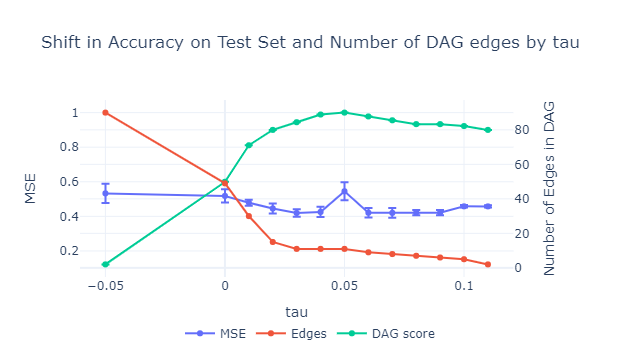

In [9]:

import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=agg_stats['theta'], y=agg_stats['MSE_mean'], name="MSE",         
    error_y=dict(
            type='data', # value of error bar given in data coordinates
            array=agg_stats['MSE_std'],
            visible=True)
            ),
    secondary_y=False, 
)

fig.add_trace(
    go.Scatter(x=n_edges[0], y=n_edges[1], name="Edges"),
    secondary_y=True,
)

fig.add_trace(
    go.Scatter(x=agg_stats['theta'], y=agg_stats['DAG_mean'], name="DAG score",         
    error_y=dict(
            type='data', # value of error bar given in data coordinates
            array=agg_stats['DAG_std'],
            visible=True)
            ),
    secondary_y=False,
)

# Add figure title
fig.update_layout(
    title={
        'text': "Shift in Accuracy on Test Set and Number of DAG edges by tau",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    legend={
        'y':-0.4,
        'x':0.5,
        'orientation':"h",
        'xanchor': 'center',
        'yanchor': 'bottom'},
    template='plotly_white'
    
)

# Set x-axis title
fig.update_xaxes(title_text="tau")

# Set y-axes titles
fig.update_yaxes(title_text="MSE", secondary_y=False)
fig.update_yaxes(title_text="Number of Edges in DAG", secondary_y=True)


fig.show()

## Dataset Size experiment

In [5]:

agg_stats_all = pd.DataFrame()

for size in [50,100,200,500,1000,2000,3000,4000,5000]:
    # filename = f"5FoldCASTLE.Reg.Synth.{size}.pkl"
# for size in [50,100,200,500,1000]:
    filename = f"results/Nested10FoldCASTLE.Reg.Synth.{size}.pkl"
    describe = load_pickle(os.path.join(filename))

    agg_stats = pd.DataFrame([(describe[c]['theta'],describe[c]['fold'],describe[c]['MSE'],describe[c]['DAG score']) for c in describe]).groupby(0, as_index=False).agg({1 : ['max'], 2 : ['mean', 'std'], 3 : ['mean', 'std']})
    agg_stats.columns = ['theta', 'folds', 'MSE_mean', 'MSE_std', 'DAG_mean', 'DAG_std']

    agg_stats.loc[agg_stats['theta']==-1,'theta'] = -0.05

    # display(agg_stats)

    n_edges = pd.DataFrame([(theta, nx.from_numpy_matrix(DAG_retreive_np(W_est, theta), create_using=nx.DiGraph, parallel_edges=False).number_of_edges()) for theta in agg_stats['theta']])

    n_edges.loc[n_edges[0]==-1,0] = -0.05
    n_edges.loc[n_edges[0]==-0.05,1] = nx.from_numpy_matrix(W_est, create_using=nx.DiGraph, parallel_edges=False).number_of_edges()

    # display(n_edges)

    n_edges_DAG = n_edges.merge(pd.DataFrame([(theta, nx.is_directed_acyclic_graph(nx.from_numpy_matrix(DAG_retreive_np(W_est, theta), create_using=nx.DiGraph, parallel_edges=False))) for theta in agg_stats['theta']]), on=0)

    n_edges_DAG.columns = ['theta', 'N_edges', 'is_DAG']

    agg_stats.merge(n_edges_DAG,on='theta')
    agg_stats['Dset_sz'] = size

    # display(agg_stats)

    agg_stats_all = pd.concat([agg_stats_all,agg_stats])

agg_stats_all


Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.50.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.100.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.200.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.500.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.1000.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.2000.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.3000.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.4000.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.5000.pkl


,theta,folds,MSE_mean,MSE_std,DAG_mean,DAG_std,Dset_sz
0,-0.05,3,1.620816,0.551235,0.122222,0.0,50
0,-0.05,5,1.254848,0.119531,0.122222,0.0,100
1,0.05,5,0.835975,0.031478,1.000000,0.0,100
0,-0.05,5,1.033812,0.054818,0.122222,0.0,200
1,0.05,5,0.806671,0.016211,1.000000,0.0,200
0,-0.05,5,0.866045,0.032994,0.122222,0.0,500
1,0.05,5,0.770231,0.018988,1.000000,0.0,500
0,-0.05,5,0.814918,0.023716,0.122222,0.0,1000
1,0.05,5,0.761892,0.016900,1.000000,0.0,1000
0,-0.05,5,0.751612,0.017277,0.122222,0.0,2000


In [6]:
ds = agg_stats_all[['theta', 'MSE_mean', 'MSE_std','Dset_sz']]

ds['values'] = ["{0:.2f}".format(round(mean,2))+" ({0:.2f})".format(round(std,2)) for mean,std in zip(ds['MSE_mean'],ds['MSE_std']) ]
ds.loc[ds['theta']==-0.05,'theta'] = "Unconstrained"
ds.loc[ds['theta']==0.05,'theta'] = "Injected"
table = ds.pivot(index='Dset_sz',columns='theta', values='values')

display(table)


def compute_top_2(names):
    t = ''
    pcount = round(len(names)/len(np.unique(names)))
    _, idx = np.unique(names, return_index=True)
    names = names[np.sort(idx)]
    print(names)
    for i in range(len(names)):
        t += ' & \multicolumn{' + str(pcount) + '}{c}{' + str(names[i]) + '}'
    return t
            
# top1 = '\multirow{2}{*}{Dataset} & \multirow{2}{*}{BC$^{*}$}' + compute_top(table.columns.values[1:]) + '\\\\'
top1 = 'Dataset' + compute_top_2(table.columns.values) + '\\\\ \n\hline '

print_table = lambda table, top : table.to_latex(escape = False, index = True, index_names = False, header =False,
                     formatters=[(lambda x : '\!' + str(x) + '\!') for col in table.columns.values],
#                      header = [f'\!\!{nice_relations[col[-1:]] if col != "BC" else ""}\!\!' for col in table.columns.values],\
                     column_format = 'r' + 'c' * (len(table.columns.values)),
                    ).replace(r'\toprule', top).replace(r'\midrule', r'\hline').replace(r'\bottomrule', r'\hline').replace('.0%', '%').replace('\!%', '\!0%').replace('%', '\%')

print(print_table(table, top1))

/vol/bitbucket/fr920/envs/bayesenv/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/vol/bitbucket/fr920/envs/bayesenv/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



theta,Injected,Unconstrained
Dset_sz,,
50,NaN,1.62 (0.55)
100,0.84 (0.03),1.25 (0.12)
200,0.81 (0.02),1.03 (0.05)
500,0.77 (0.02),0.87 (0.03)
1000,0.76 (0.02),0.81 (0.02)
2000,0.75 (0.01),0.75 (0.02)
3000,0.74 (0.02),0.73 (0.02)
4000,0.74 (0.02),0.72 (0.02)
5000,0.74 (0.01),0.72 (0.02)


['Injected' 'Unconstrained']
\begin{tabular}{rcc}
Dataset & \multicolumn{1}{c}{Injected} & \multicolumn{1}{c}{Unconstrained}\\ 
\hline 
50   &              NaN &  \!1.62 (0.55)\! \\
100  &  \!0.84 (0.03)\! &  \!1.25 (0.12)\! \\
200  &  \!0.81 (0.02)\! &  \!1.03 (0.05)\! \\
500  &  \!0.77 (0.02)\! &  \!0.87 (0.03)\! \\
1000 &  \!0.76 (0.02)\! &  \!0.81 (0.02)\! \\
2000 &  \!0.75 (0.01)\! &  \!0.75 (0.02)\! \\
3000 &  \!0.74 (0.02)\! &  \!0.73 (0.02)\! \\
4000 &  \!0.74 (0.02)\! &  \!0.72 (0.02)\! \\
5000 &  \!0.74 (0.01)\! &  \!0.72 (0.02)\! \\
\hline
\end{tabular}



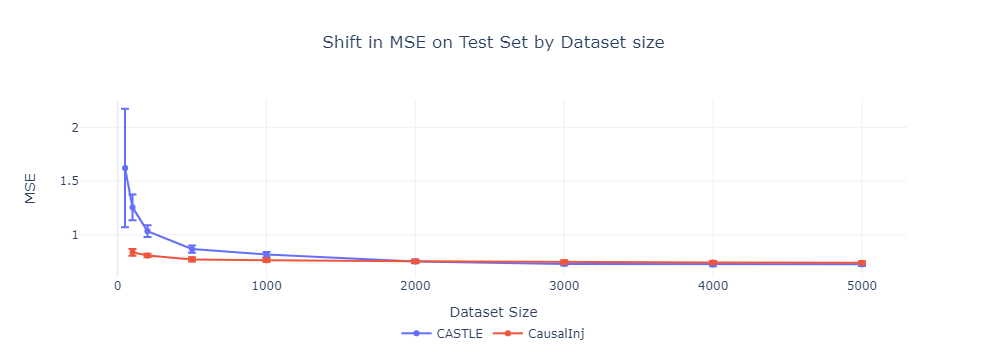

In [7]:
ds1 = agg_stats_all.loc[agg_stats_all['theta']==-0.05][['MSE_mean','MSE_std','Dset_sz']]
ds2 = agg_stats_all.loc[agg_stats_all['theta']==0.05][['MSE_mean','MSE_std','Dset_sz']]



import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": False}]])

# Add traces
fig.add_trace(
    go.Scatter(x=ds1['Dset_sz'], y=ds1['MSE_mean'], name="CASTLE",         
    error_y=dict(
            type='data', # value of error bar given in data coordinates
            array=ds1['MSE_std'],
            visible=True)
            ),
    secondary_y=False, 
)

fig.add_trace(
    go.Scatter(x=ds2['Dset_sz'], y=ds2['MSE_mean'], name="CausalInj",         
    error_y=dict(
            type='data', # value of error bar given in data coordinates
            array=ds2['MSE_std'],
            visible=True)
            ),
    secondary_y=False, 
)

# Add figure title
fig.update_layout(
    title={
        'text': "Shift in MSE on Test Set by Dataset size",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    legend={
        'y':-0.4,
        'x':0.5,
        'orientation':"h",
        'xanchor': 'center',
        'yanchor': 'bottom'},
    template='plotly_white'
    
)

# Set x-axis title
fig.update_xaxes(title_text="Dataset Size")

# Set y-axes titles
fig.update_yaxes(title_text="MSE", secondary_y=False)
# fig.update_yaxes(title_text="Number of Edges in DAG", secondary_y=True)


fig.show()

## Out-of-distribution experiment

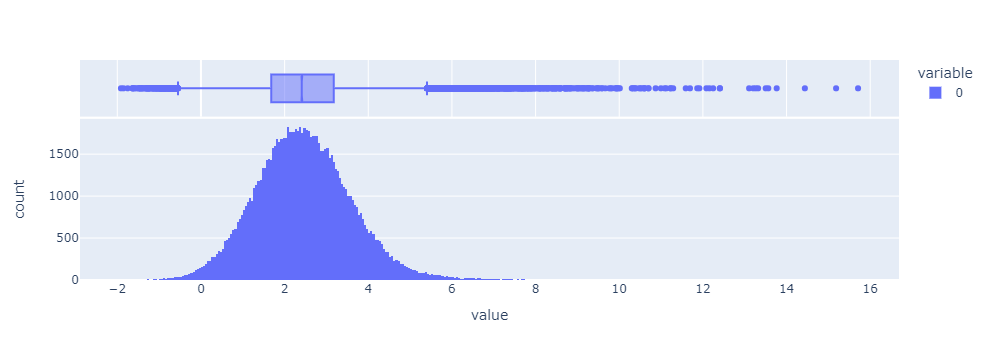

In [13]:
df = pd.read_csv(csv)
fig = px.histogram(df['0'], marginal="box")
fig.show()

In [14]:
pd.qcut(df['0'], q=10, precision=0).value_counts()

(3.9, 15.7]    10000
(3.4, 3.9]     10000
(3.0, 3.4]     10000
(2.7, 3.0]     10000
(2.4, 2.7]     10000
(2.1, 2.4]     10000
(1.8, 2.1]     10000
(1.5, 1.8]     10000
(1.0, 1.5]     10000
(-2.0, 1.0]    10000
Name: 0, dtype: int64

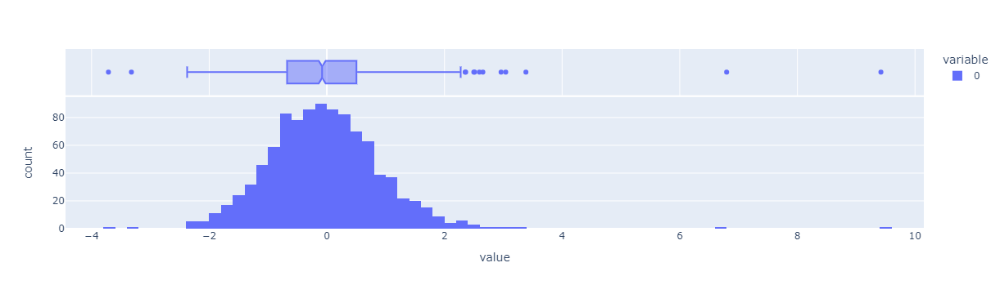

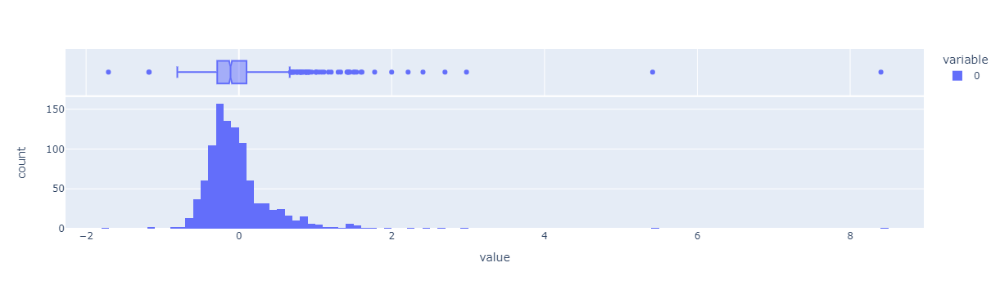

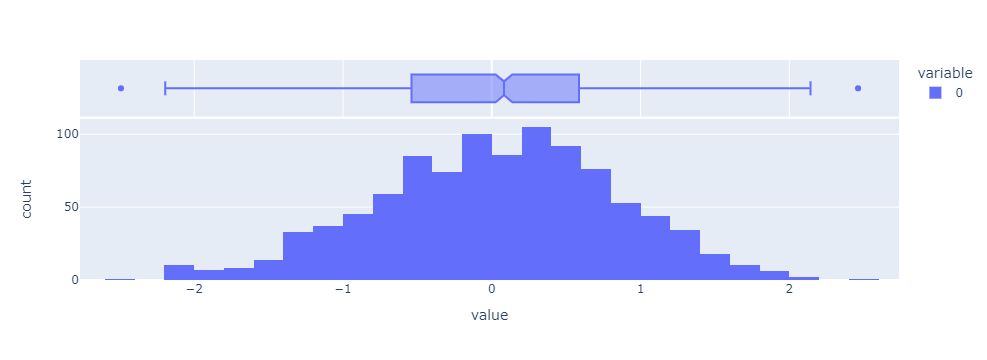

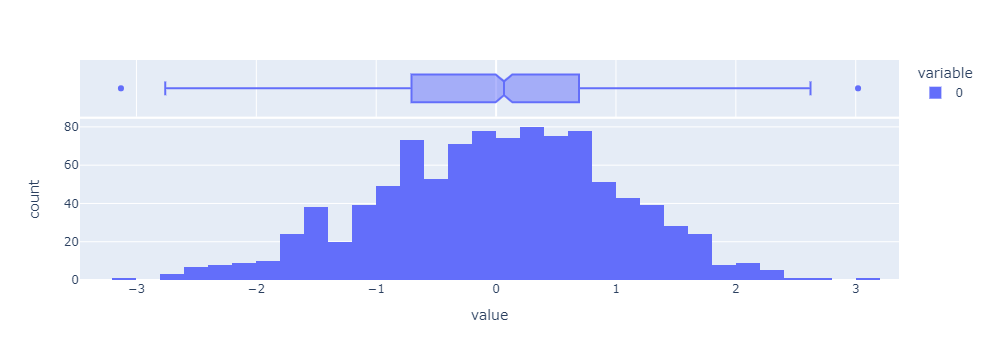

In [50]:
y_hat = castle.pred(X_test)
errors = castle.pred(X_test)-np.expand_dims(y_test , -1)
standard_errors = (errors-errors.mean())/errors.std()

fig = px.histogram(y_test, marginal="box")
fig.show()

fig = px.histogram(y_hat, marginal="box")
fig.show()

# fig = px.histogram(errors, marginal="box")
# fig.show()

fig = px.histogram(standard_errors, marginal="box")
fig.show()

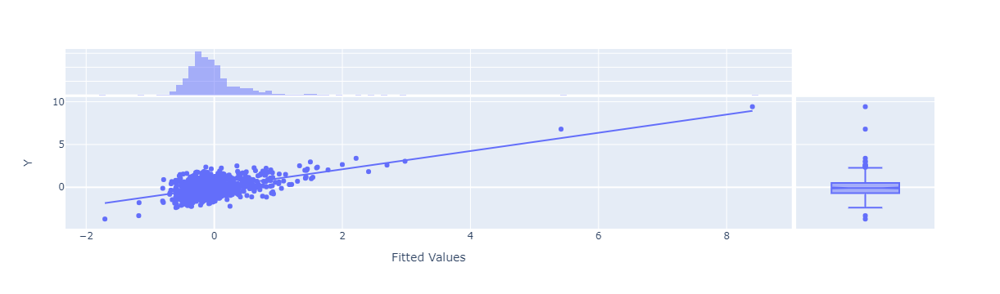

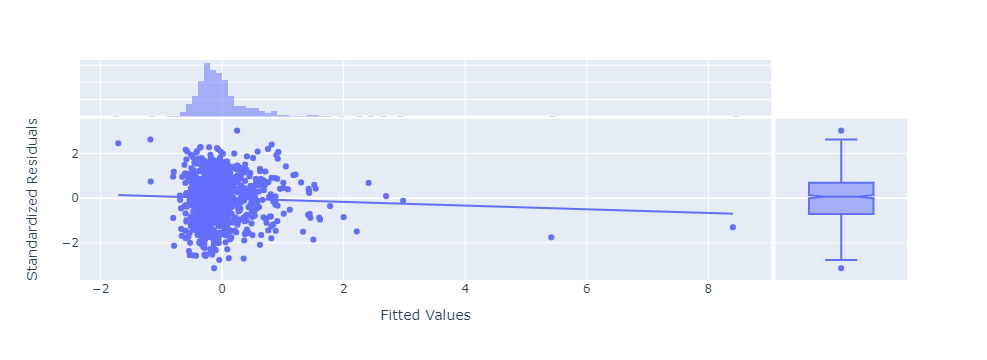

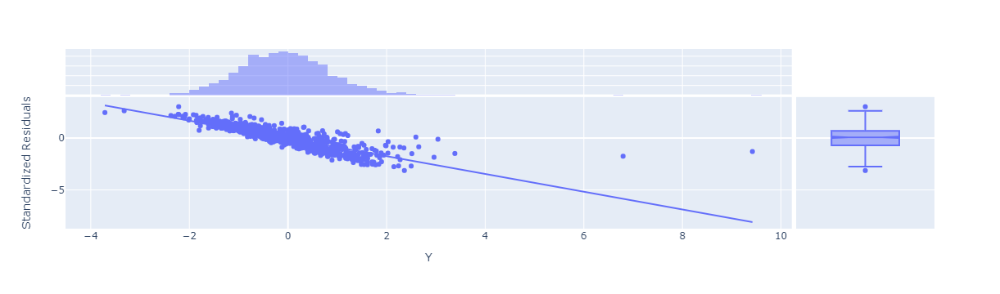

In [62]:
fig = px.scatter(x=castle.pred(X_test).flatten(), y=y_test, marginal_x="histogram", marginal_y="box",
                 trendline="ols",
                    labels={
                     "x": "Fitted Values",
                     "y": "Y"
                    },)
fig.show()

fig = px.scatter(x=castle.pred(X_test).flatten(), y=standard_errors.flatten(), marginal_x="histogram", marginal_y="box",
                 trendline="ols",
                    labels={
                     "x": "Fitted Values",
                     "y": "Standardized Residuals"
                    },)
fig.show()

# fig = px.scatter(x=y_test, y=standard_errors.flatten(), marginal_x="histogram", marginal_y="box",
#                  trendline="ols",
#                     labels={
#                      "x": "Y",
#                      "y": "Standardized Residuals"
#                     },)
# fig.show()

In [109]:
print(X_test.shape)
print("MSE = ", mean_squared_error(castle.pred(X_test), y_test))
# print("MSE = ", mean_squared_error(castle.pred(X_test), y_test))

std_val = 1
X_test_sub = X_test[np.where((X_test[:,0] < -std_val) | (X_test[:,0] > std_val))]
y_test_sub = y_test[np.where((y_test < -std_val) | (y_test >std_val))]

print(X_test_sub.shape)
print(f"MSE for std={std_val} : ", mean_squared_error(castle.pred(X_test_sub), y_test_sub))

std_val = 2
X_test_sub = X_test[np.where((X_test[:,0] < -std_val) | (X_test[:,0] > std_val))]
y_test_sub = y_test[np.where((y_test < -std_val) | (y_test >std_val))]

print(X_test_sub.shape)
print(f"MSE for std={std_val} : ", mean_squared_error(castle.pred(X_test_sub), y_test_sub))

std_val = 3
X_test_sub = X_test[np.where((X_test[:,0] < -std_val) | (X_test[:,0] > std_val))]
y_test_sub = y_test[np.where((y_test < -std_val) | (y_test >std_val))]

print(X_test_sub.shape)
print(f"MSE for std={std_val} : ", mean_squared_error(castle.pred(X_test_sub), y_test_sub))


(1000, 10)
MSE =  0.6501564120305993
(264, 10)
MSE for std=1 :  1.5679419226949258
(31, 10)
MSE for std=2 :  2.502481157236105
(6, 10)
MSE for std=3 :  2.155578785512532


Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.62.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.125.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.625.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.1250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.2500.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.3750.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.5000.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.6250.v2.pkl


/vol/bitbucket/fr920/envs/bayesenv/lib/python3.6/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



theta,Causal Injected,CASTLE
Dset_sz,,
62,0.87 (0.03),1.61 (0.20)
125,0.83 (0.02),1.16 (0.08)
250,0.80 (0.01),0.97 (0.04)
625,0.77 (0.02),0.86 (0.03)
1250,0.76 (0.02),0.80 (0.02)
2500,0.75 (0.02),0.74 (0.02)
3750,0.74 (0.02),0.72 (0.02)
5000,0.74 (0.02),0.73 (0.02)
6250,0.73 (0.02),0.72 (0.02)


\begin{tabular}{rcc}
Dataset & \multicolumn{1}{c}{CASTLE} & \multicolumn{1}{c}{Causal Injected}\\ 
\hline 
62   &  \!1.61 (0.20)\! &  \!0.87 (0.03)\! \\
125  &  \!1.16 (0.08)\! &  \!0.83 (0.02)\! \\
250  &  \!0.97 (0.04)\! &  \!0.80 (0.01)\! \\
625  &  \!0.86 (0.03)\! &  \!0.77 (0.02)\! \\
1250 &  \!0.80 (0.02)\! &  \!0.76 (0.02)\! \\
2500 &  \!0.74 (0.02)\! &  \!0.75 (0.02)\! \\
3750 &  \!0.72 (0.02)\! &  \!0.74 (0.02)\! \\
5000 &  \!0.73 (0.02)\! &  \!0.74 (0.02)\! \\
6250 &  \!0.72 (0.02)\! &  \!0.73 (0.02)\! \\
\hline
\end{tabular}



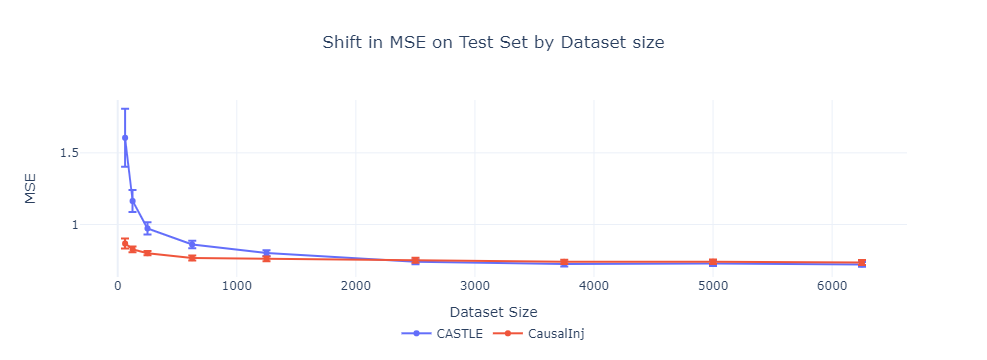

Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.62.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.125.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.625.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.1250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.2500.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.3750.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.5000.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.6250.v2.pkl


theta,Causal Injected,CASTLE
Dset_sz,,
62,1.82 (0.06),2.67 (0.32)
125,1.83 (0.07),2.26 (0.19)
250,1.85 (0.07),2.02 (0.10)
625,1.81 (0.06),1.77 (0.06)
1250,1.79 (0.05),1.71 (0.06)
2500,1.77 (0.04),1.66 (0.04)
3750,1.73 (0.03),1.65 (0.04)
5000,1.74 (0.04),1.66 (0.05)
6250,1.74 (0.04),1.64 (0.04)


\begin{tabular}{rcc}
Dataset & \multicolumn{1}{c}{CASTLE} & \multicolumn{1}{c}{Causal Injected}\\ 
\hline 
62   &  \!2.67 (0.32)\! &  \!1.82 (0.06)\! \\
125  &  \!2.26 (0.19)\! &  \!1.83 (0.07)\! \\
250  &  \!2.02 (0.10)\! &  \!1.85 (0.07)\! \\
625  &  \!1.77 (0.06)\! &  \!1.81 (0.06)\! \\
1250 &  \!1.71 (0.06)\! &  \!1.79 (0.05)\! \\
2500 &  \!1.66 (0.04)\! &  \!1.77 (0.04)\! \\
3750 &  \!1.65 (0.04)\! &  \!1.73 (0.03)\! \\
5000 &  \!1.66 (0.05)\! &  \!1.74 (0.04)\! \\
6250 &  \!1.64 (0.04)\! &  \!1.74 (0.04)\! \\
\hline
\end{tabular}



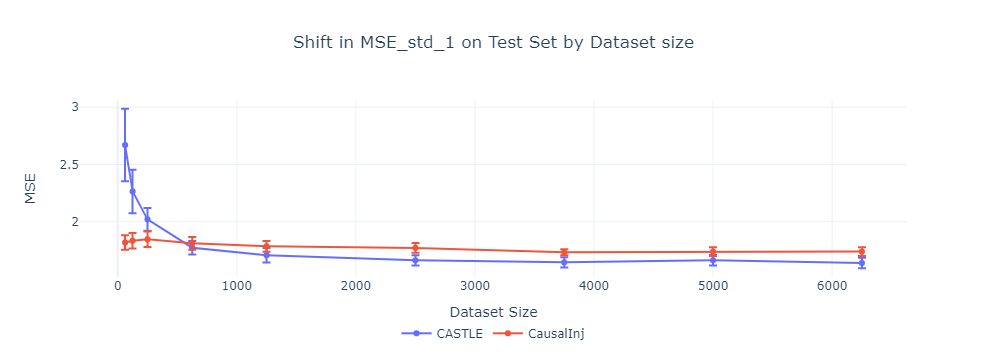

Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.62.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.125.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.625.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.1250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.2500.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.3750.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.5000.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.6250.v2.pkl


theta,Causal Injected,CASTLE
Dset_sz,,
62,3.58 (0.29),5.33 (1.29)
125,3.81 (0.35),4.98 (1.06)
250,3.81 (0.30),4.06 (0.54)
625,3.43 (0.24),2.98 (0.27)
1250,3.39 (0.22),2.92 (0.26)
2500,3.32 (0.22),2.83 (0.20)
3750,3.14 (0.09),2.84 (0.17)
5000,3.10 (0.13),2.87 (0.16)
6250,3.16 (0.13),2.78 (0.17)


\begin{tabular}{rcc}
Dataset & \multicolumn{1}{c}{CASTLE} & \multicolumn{1}{c}{Causal Injected}\\ 
\hline 
62   &  \!5.33 (1.29)\! &  \!3.58 (0.29)\! \\
125  &  \!4.98 (1.06)\! &  \!3.81 (0.35)\! \\
250  &  \!4.06 (0.54)\! &  \!3.81 (0.30)\! \\
625  &  \!2.98 (0.27)\! &  \!3.43 (0.24)\! \\
1250 &  \!2.92 (0.26)\! &  \!3.39 (0.22)\! \\
2500 &  \!2.83 (0.20)\! &  \!3.32 (0.22)\! \\
3750 &  \!2.84 (0.17)\! &  \!3.14 (0.09)\! \\
5000 &  \!2.87 (0.16)\! &  \!3.10 (0.13)\! \\
6250 &  \!2.78 (0.17)\! &  \!3.16 (0.13)\! \\
\hline
\end{tabular}



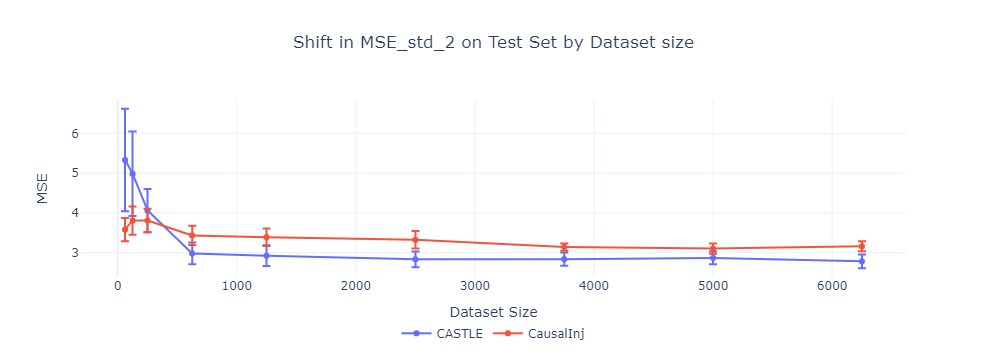

Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.62.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.125.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.625.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.1250.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.2500.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.3750.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.5000.v2.pkl
Loaded PICKLE from results/Nested10FoldCASTLE.Reg.Synth.6250.v2.pkl


theta,Causal Injected,CASTLE
Dset_sz,,
62,6.12 (1.35),13.57 (5.13)
125,6.84 (1.32),12.46 (4.25)
250,6.54 (1.06),8.45 (2.37)
625,4.35 (0.80),3.63 (0.84)
1250,4.35 (0.77),3.56 (0.75)
2500,4.18 (0.78),2.97 (0.60)
3750,3.29 (0.47),2.93 (0.52)
5000,3.02 (0.54),2.98 (0.47)
6250,3.31 (0.65),2.82 (0.48)


\begin{tabular}{rcc}
Dataset & \multicolumn{1}{c}{CASTLE} & \multicolumn{1}{c}{Causal Injected}\\ 
\hline 
62   &  \!13.57 (5.13)\! &  \!6.12 (1.35)\! \\
125  &  \!12.46 (4.25)\! &  \!6.84 (1.32)\! \\
250  &   \!8.45 (2.37)\! &  \!6.54 (1.06)\! \\
625  &   \!3.63 (0.84)\! &  \!4.35 (0.80)\! \\
1250 &   \!3.56 (0.75)\! &  \!4.35 (0.77)\! \\
2500 &   \!2.97 (0.60)\! &  \!4.18 (0.78)\! \\
3750 &   \!2.93 (0.52)\! &  \!3.29 (0.47)\! \\
5000 &   \!2.98 (0.47)\! &  \!3.02 (0.54)\! \\
6250 &   \!2.82 (0.48)\! &  \!3.31 (0.65)\! \\
\hline
\end{tabular}



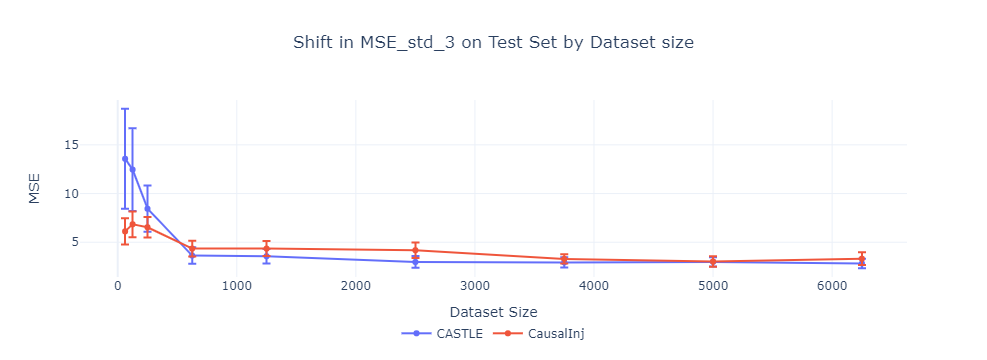

In [7]:
for std in ["MSE","MSE_std_1","MSE_std_2","MSE_std_3"]:

    version = "v2"
#     std = 
    agg_stats_all = pd.DataFrame()
    dset_list = [50,100,200,500,1000,2000,3000,4000,5000
                ]
    sizes = [int(e*1.25) for e in dset_list]


    for size in sizes:
        # filename = f"5FoldCASTLE.Reg.Synth.{size}.pkl"
    # for size in [50,100,200,500,1000]:
        filename = f"results/Nested10FoldCASTLE.Reg.Synth.{size}.{version}.pkl"
        describe = load_pickle(os.path.join(filename))

    #     display(pd.DataFrame([(describe[c].items()) for c in describe]))
    #     display(pd.DataFrame.from_dict(describe).T)
    #     print([describe.items() for a in describe])


        agg_stats = pd.DataFrame([(describe[c]['theta'],describe[c]['fold'],describe[c][std],describe[c]['DAG score']) for c in describe]).groupby(0, as_index=False).agg({1 : ['max'], 2 : ['mean', 'std'], 3 : ['mean', 'std']})
        agg_stats.columns = ['theta', 'folds', 'MSE_mean', 'MSE_std', 'DAG_mean', 'DAG_std']

        agg_stats.loc[agg_stats['theta']==-1,'theta'] = -0.05

        # display(agg_stats)

        n_edges = pd.DataFrame([(theta, nx.from_numpy_matrix(DAG_retreive_np(W_est, theta), create_using=nx.DiGraph, parallel_edges=False).number_of_edges()) for theta in agg_stats['theta']])

        n_edges.loc[n_edges[0]==-1,0] = -0.05
        n_edges.loc[n_edges[0]==-0.05,1] = nx.from_numpy_matrix(W_est, create_using=nx.DiGraph, parallel_edges=False).number_of_edges()

        # display(n_edges)

        n_edges_DAG = n_edges.merge(pd.DataFrame([(theta, nx.is_directed_acyclic_graph(nx.from_numpy_matrix(DAG_retreive_np(W_est, theta), create_using=nx.DiGraph, parallel_edges=False))) for theta in agg_stats['theta']]), on=0)

        n_edges_DAG.columns = ['theta', 'N_edges', 'is_DAG']

        agg_stats.merge(n_edges_DAG,on='theta')
        agg_stats['Dset_sz'] = size

        # display(agg_stats)

        agg_stats_all = pd.concat([agg_stats_all,agg_stats])

    agg_stats_all

    ds = agg_stats_all[['theta', 'MSE_mean', 'MSE_std','Dset_sz']]

    ds['values'] = ["{0:.2f}".format(round(mean,2))+" ({0:.2f})".format(round(std,2)) for mean,std in zip(ds['MSE_mean'],ds['MSE_std']) ]
    ds.loc[ds['theta']==-0.05,'theta'] = "CASTLE"
    ds.loc[ds['theta']==0.05,'theta'] = "Causal Injected"
    table = ds.pivot(index='Dset_sz',columns='theta', values='values')
    cols = list(table.columns.values)
#     print(cols)

    cols = cols[-1:] + cols[:-1]

    display(table[cols])


    def compute_top_2(names):
        t = ''
        pcount = round(len(names)/len(np.unique(names)))
        _, idx = np.unique(names, return_index=True)
        names = names[np.sort(idx)]
#         print(names)
        for i in range(len(names)):
            t += ' & \multicolumn{' + str(pcount) + '}{c}{' + str(names[i]) + '}'
        return t

    # top1 = '\multirow{2}{*}{Dataset} & \multirow{2}{*}{BC$^{*}$}' + compute_top(table.columns.values[1:]) + '\\\\'
    top1 = 'Dataset' + compute_top_2(table.columns.values) + '\\\\ \n\hline '

    print_table = lambda table, top : table.to_latex(escape = False, index = True, index_names = False, header =False,
                         formatters=[(lambda x : '\!' + str(x) + '\!') for col in table.columns.values],
    #                      header = [f'\!\!{nice_relations[col[-1:]] if col != "BC" else ""}\!\!' for col in table.columns.values],\
                         column_format = 'r' + 'c' * (len(table.columns.values)),
                        ).replace(r'\toprule', top).replace(r'\midrule', r'\hline').replace(r'\bottomrule', r'\hline').replace('.0%', '%').replace('\!%', '\!0%').replace('%', '\%')

    print(print_table(table, top1))

    ds1 = agg_stats_all.loc[agg_stats_all['theta']==-0.05][['MSE_mean','MSE_std','Dset_sz']]
    ds2 = agg_stats_all.loc[agg_stats_all['theta']==0.05][['MSE_mean','MSE_std','Dset_sz']]

    import plotly.graph_objects as go
    from plotly.subplots import make_subplots

    # Create figure with secondary y-axis
    fig = make_subplots(specs=[[{"secondary_y": False}]])

    # Add traces
    fig.add_trace(
        go.Scatter(x=ds1['Dset_sz'], y=ds1['MSE_mean'], name=f"CASTLE",         
        error_y=dict(
                type='data', # value of error bar given in data coordinates
                array=ds1['MSE_std'],
                visible=True)
                ),
        secondary_y=False, 
    )

    fig.add_trace(
        go.Scatter(x=ds2['Dset_sz'], y=ds2['MSE_mean'], name=f"CausalInj",         
        error_y=dict(
                type='data', # value of error bar given in data coordinates
                array=ds2['MSE_std'],
                visible=True)
                ),
        secondary_y=False, 
    )

    # Add figure title
    fig.update_layout(
        title={
            'text': f"Shift in {std} on Test Set by Dataset size",
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        legend={
            'y':-0.4,
            'x':0.5,
            'orientation':"h",
            'xanchor': 'center',
            'yanchor': 'bottom'},
        template='plotly_white'

    )

    # Set x-axis title
    fig.update_xaxes(title_text="Dataset Size")

    # Set y-axes titles
    fig.update_yaxes(title_text="MSE", secondary_y=False)
    # fig.update_yaxes(title_text="Number of Edges in DAG", secondary_y=True)


    fig.show()

## Partial DAG completion

In [9]:
loaded_adj = np.array((
[0.0  ,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0],
[1.0  ,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0],
[1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0],
[1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0],
[1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0],
[1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0],
[1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0],
[1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0],
[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0],
[1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0]
))

tau = 0.05
print("tau:",tau)

maxed_adj = DAG_retreive_np(loaded_adj, tau)

heat_mat(maxed_adj)

plot_DAG(maxed_adj, ori_dag=G, graphic_type = "py")

tau: 0.05


,0,1,2,3,4,5,6,7,8,9
0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0
4,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
5,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0
6,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0
7,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0
8,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0
9,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0


Total Number of Edges in G: 88
Max in degree: 9
DAG: False


In [11]:
n_folds=1
if n_folds > 1:
    kf = KFold(n_splits = n_folds, random_state = 1, shuffle = True)

    fold = 0
    REG_castle = []
    print("Dataset limits are", np.ptp(X_DAG), np.ptp(X_test), np.ptp(y_test))
    for train_idx, val_idx in kf.split(X_DAG):
        fold += 1
        print("fold = ", fold)
        print("******* Doing dataset size = ", len(train_idx) , "****************")
        X_train = X_DAG[train_idx]
        y_train = np.expand_dims(X_DAG[train_idx][:,0], -1)
        X_val = X_DAG[val_idx]
        y_val = X_DAG[val_idx][:,0]

        tau = 0.05
        castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                            w_threshold = tau, ckpt_file = ckpt_file
                        )

        num_nodes = np.shape(X_DAG)[1]
        castle.fit(X=X_train, y=y_train, num_nodes=num_nodes, X_val=X_val, y_val=y_val,
                overwrite=False, tune=True, maxed_adj=loaded_adj, tuned=False)

        W_est = castle.pred_W(X_DAG, np.expand_dims(X_DAG[:,0], -1))
        heat_mat(W_est)
        REG_castle.append(mean_squared_error(castle.pred(X_test), y_test))
        print("MSE = ", mean_squared_error(castle.pred(X_test), y_test))

        if fold > 1:
            print("MEAN =", np.mean(REG_castle), "STD =", np.std(REG_castle))
            castle.__del__()
else:
        print("******* Doing dataset size = ", dataset_sz , "****************")
        X_train = X_DAG
        y_train = np.expand_dims(X_DAG[:,0], -1)
        X_val = X_test
        y_val = y_test

        w_threshold = 0.3
        castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                            w_threshold = w_threshold, ckpt_file = ckpt_file, seed = seed
                        )

        num_nodes = np.shape(X_DAG)[1]
        castle.fit(X=X_train, y=y_train, num_nodes=num_nodes, X_val=X_val, y_val=y_val,
                overwrite=False, tune=True, maxed_adj=loaded_adj, tuned=False, seed = seed)
        print("MSE = ", mean_squared_error(castle.pred(X_test), y_test))

        W_est = castle.pred_W(X_DAG, np.expand_dims(X_DAG[:,0], -1))
        heat_mat(W_est)

******* Doing dataset size =  5000 ****************
Random seed 2021 set for:
INFO:tensorflow:Restoring parameters from tmp.ckpt
Model Loaded from  tmp.ckpt
Begin Tuning - Apply Mask from DAG
Random seed 2021 set for:
Step 1, Loss= 0.7109 h_value: 0.00027942657
Val Loss= 0.6875
Step 2, Loss= 0.7165 h_value: 0.00025177002
Val Loss= 0.6684
Step 3, Loss= 0.7102 h_value: 0.0002632141
Val Loss= 0.6885
Step 4, Loss= 0.7247 h_value: 0.00021266937
Val Loss= 0.6673
Step 5, Loss= 0.7187 h_value: 0.00020980835
Val Loss= 0.6983
Step 6, Loss= 0.7366 h_value: 0.00024032593
Val Loss= 0.7000
Step 7, Loss= 0.7214 h_value: 0.00026130676
Val Loss= 0.6820
Step 8, Loss= 0.7216 h_value: 0.0002632141
Val Loss= 0.6717
Step 9, Loss= 0.7318 h_value: 0.00022029877
Val Loss= 0.6662
Step 10, Loss= 0.7138 h_value: 0.00020217896
Val Loss= 0.7561
Step 11, Loss= 0.7379 h_value: 0.00025844574
Val Loss= 0.6731
Step 12, Loss= 0.7190 h_value: 0.00018978119
Val Loss= 0.6646
Step 13, Loss= 0.7210 h_value: 0.00022888184
Val 

,0,1,2,3,4,5,6,7,8,9
0,0.0,0.014,0.019,0.016,0.004,0.017,0.025,0.023,0.053,0.056
1,0.009,0.0,0.066,0.071,0.066,0.003,0.01,0.009,0.01,0.005
2,0.099,0.051,0.0,0.026,0.018,0.127,0.008,0.007,0.036,0.008
3,0.088,0.052,0.023,0.0,0.027,0.015,0.099,0.097,0.039,0.008
4,0.013,0.053,0.016,0.023,0.0,0.008,0.01,0.004,0.039,0.006
5,0.031,0.006,0.013,0.006,0.008,0.0,0.011,0.013,0.01,0.008
6,0.019,0.003,0.003,0.015,0.004,0.006,0.0,0.019,0.008,0.142
7,0.027,0.007,0.003,0.013,0.004,0.012,0.028,0.0,0.004,0.01
8,0.04,0.006,0.007,0.003,0.004,0.014,0.015,0.006,0.0,0.01
9,0.037,0.004,0.004,0.005,0.005,0.007,0.085,0.003,0.005,0.0


,0,1,2,3,4,5,6,7,8,9
0,0.0,0.014,0.019,0.016,0.004,0.017,0.025,0.023,0.053,0.056
1,0.009,0.0,0.066,0.071,0.066,0.003,0.01,0.009,0.01,0.005
2,0.099,0.051,0.0,0.026,0.018,0.127,0.008,0.007,0.036,0.008
3,0.088,0.052,0.023,0.0,0.027,0.015,0.099,0.097,0.039,0.008
4,0.013,0.053,0.016,0.023,0.0,0.008,0.01,0.004,0.039,0.006
5,0.031,0.006,0.013,0.006,0.008,0.0,0.011,0.013,0.01,0.008
6,0.019,0.003,0.003,0.015,0.004,0.006,0.0,0.019,0.008,0.142
7,0.027,0.007,0.003,0.013,0.004,0.012,0.028,0.0,0.004,0.01
8,0.04,0.006,0.007,0.003,0.004,0.014,0.015,0.006,0.0,0.01
9,0.037,0.004,0.004,0.005,0.005,0.007,0.085,0.003,0.005,0.0


,0,1,2,3,4,5,6,7,8,9
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.053,0.056
1,0.0,0.0,0.066,0.071,0.066,0.0,0.0,0.0,0.0,0.0
2,0.099,0.0,0.0,0.0,0.0,0.127,0.0,0.0,0.0,0.0
3,0.088,0.0,0.0,0.0,0.0,0.0,0.099,0.097,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.142
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Total Number of Edges in G: 11
Max in degree: 2
DAG: True

Black Arrow = Edge in the original DAG,
Red Arrow = Missing Edge, Blue Arrow = Additional Edge 


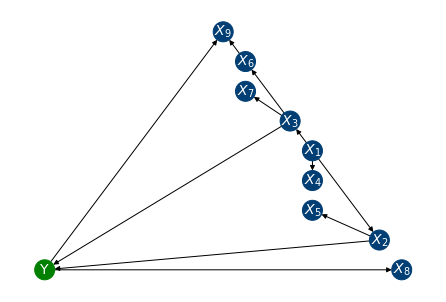

In [13]:
heat_mat(W_est)

maxed_adj = DAG_retreive_np(W_est, 0.05)

heat_mat(maxed_adj)

plot_DAG(maxed_adj, ori_dag=G, graphic_type = "nx")

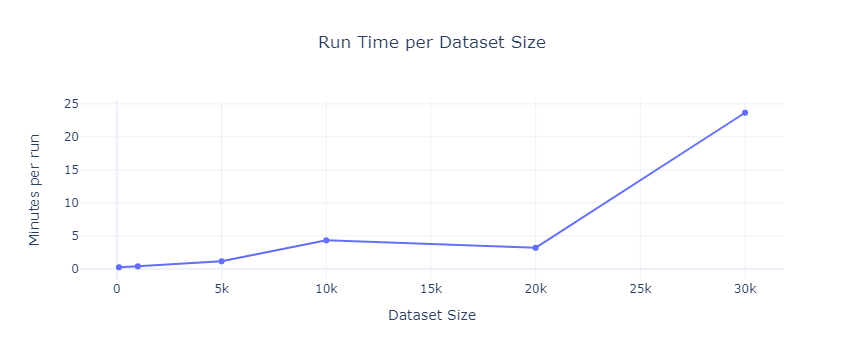

In [98]:
v="r2"
in_f='1'
a = []
for size in [100,1000,5000,10000,20000,30000]:
    a.append((size, load_pickle(f'./results/Nested5FoldCASTLE.Reg.Synth.{size}.{v}.pkl', verbose=False)[f'out_fold=1theta=-1, fold={in_f}']['timestamp'].total_seconds()/60))
ds1=pd.DataFrame(a)

import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": False}]])

# Add traces
fig.add_trace(
    go.Scatter(x=ds1[0], y=ds1[1], name=f"CASTLE",         
#     error_y=dict(
#             type='data', # value of error bar given in data coordinates
#             array=ds1['MSE_std'],
#             visible=True)
            ),
    secondary_y=False, 
)

# Add figure title
fig.update_layout(
    title={
        'text': f"Run Time per Dataset Size",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    legend={
        'y':-0.4,
        'x':0.5,
        'orientation':"h",
        'xanchor': 'center',
        'yanchor': 'bottom'},
    template='plotly_white'

)

# Set x-axis title
fig.update_xaxes(title_text="Dataset Size")

# Set y-axes titles
fig.update_yaxes(title_text="Minutes per run", secondary_y=False)
# fig.update_yaxes(title_text="Number of Edges in DAG", secondary_y=True)


fig.show()

### Old stuff

In [10]:
run_full = False
if run_full:
    print("******* Doing dataset size = ", dataset_sz , "****************")
    X_train = X_DAG
    y_train = np.expand_dims(X_DAG[:,0], -1)
    X_val = X_test
    y_val = y_test

    w_threshold = 0.3
    castle = CASTLE(num_train = X_DAG.shape[0], num_inputs = X_DAG.shape[1], reg_lambda = reg_lambda, reg_beta = reg_beta,
                        w_threshold = w_threshold, ckpt_file = ckpt_file
                    )

    num_nodes = np.shape(X_DAG)[1]
    castle.fit(X=X_train, y=y_train, num_nodes=num_nodes, X_val=X_val, y_val=y_val,
            overwrite=False, tune=True, tuned=False, maxed_adj=maxed_adj)

    W_est = castle.pred_W(X_DAG, np.expand_dims(X_DAG[:,0], -1))
    heat_mat(W_est)

In [11]:
save_mat = False
if save_mat:
    pd.DataFrame(W_est).to_csv("adj_matrix.csv", index=False)

In [12]:
# necessary when wanting to load different castle consecutively
clean_up = False
if clean_up:
    castle.__del__()

In [6]:
load_hard_mat = True
if load_hard_mat:
    ### To run only if the above code is not run
    intersection_matrix= (
    [0.0,0.002,0.017,0.021,0.005,0.045,0.035,0.007,0.053,0.055],
    [0.008,0.0,0.072,0.061,0.07,0.005,0.011,0.008,0.004,0.007],
    [0.095,0.036,0.0,0.031,0.027,0.139,0.009,0.005,0.011,0.008],
    [0.071,0.04,0.031,0.0,0.035,0.003,0.108,0.109,0.011,0.007],
    [0.013,0.045,0.022,0.027,0.0,0.008,0.011,0.004,0.007,0.005],
    [0.039,0.003,0.022,0.006,0.005,0.0,0.009,0.007,0.003,0.014],
    [0.038,0.004,0.007,0.011,0.007,0.01,0.0,0.023,0.003,0.163],
    [0.024,0.006,0.004,0.01,0.003,0.022,0.028,0.0,0.009,0.009],
    [0.026,0.004,0.006,0.002,0.009,0.004,0.015,0.005,0.0,0.014],
    [0.026,0.004,0.004,0.005,0.004,0.008,0.073,0.004,0.007,0.0]
    )
    # intersection_matrix=pd.DataFrame(intersection_matrix)
    # intersection_matrix=intersection_matrix.to_numpy()
    W_est = np.array(intersection_matrix)

In [9]:
import math
penalty_mis = -1
penalty_add = -1
penalty_dir = -1

n=G.number_of_nodes()
r=2
n_perm = math.factorial(n)/math.factorial(n-r)

print(G.edges())

print(G1.edges())

# import collections
# compare = lambda x, y: collections.Counter(x) == collections.Counter(y)

# compare(G.edges(),G1.edges())

a = set(G.edges())
b = set(G1.edges())

print("Equal sets:",a==b)
print("intersection:",a.intersection(b)   )
print("union:",a.union(b)        )
print("unequal:",a.union(b)  - a.intersection(b))   

print("Missing:",len(a-a.intersection(b)))
print("Added:",len(b-a.intersection(b)))

(n_perm + len(a-a.intersection(b))*penalty_mis + len(b-a.intersection(b))*penalty_add)/n_perm

[(0, 8), (0, 9), (1, 2), (1, 3), (1, 4), (2, 5), (2, 0), (3, 0), (3, 6), (3, 7), (6, 9)]
[(0, 8), (0, 9), (1, 2), (1, 3), (1, 4), (2, 0), (2, 5), (3, 0), (3, 6), (3, 7), (6, 9)]
Equal sets: True
intersection: {(1, 2), (6, 9), (1, 3), (3, 0), (1, 4), (2, 0), (3, 6), (0, 9), (3, 7), (2, 5), (0, 8)}
union: {(6, 9), (1, 3), (3, 0), (1, 4), (3, 7), (2, 5), (0, 8), (1, 2), (2, 0), (3, 6), (0, 9)}
unequal: set()
Missing: 0
Added: 0


1.0